# Multimodal Report Generation Agent 

<a href="https://colab.research.google.com/github/run-llama/llama_cloud_services/blob/main/examples/parse/multimodal/multimodal_report_generation_agent.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this cookbook we show you how to build a multimodal report generation agent from a bank of research reports. We use the a set of ICLR papers (which were also used as the dataset in our [DeepLearning.ai course](https://www.deeplearning.ai/short-courses/building-agentic-rag-with-llamaindex/?utm_campaign=llamaindexC2-launch&utm_medium=headband&utm_source=dlai-homepage).

![](multimodal_report_generation_agent_img.png)

We use our workflow abstraction to define an agentic system that contains two main phases: a research phase that pulls in relevant files through chunk-level or file-level retrieval, and then a blog generation phase that synthesizes the final report.

## Setup

In [ ]:
import nest_asyncio

nest_asyncio.apply()

In [ ]:
!pip install -U llama-index

### Setup 

To begin with, set up your OpenAI and LlamaCloud API keys below

In [ ]:
import os
from getpass import getpass


if "OPENAI_API_KEY" not in os.environ:
    os.environ["OPENAI_API_KEY"] = getpass("Add your OpenAI API Key")

if "LLAMA_CLOUD_API_KEY" not in os.environ:
    os.environ["LLAMA_CLOUD_API_KEY"] = getpass("Add your LlamaCloud API Key")

### Model Setup

Setup models that will be used for downstream orchestration.

In [ ]:
from llama_index.core import Settings
from llama_index.llms.openai import OpenAI
from llama_index.embeddings.openai import OpenAIEmbedding

embed_model = OpenAIEmbedding(model="text-embedding-3-large")
llm = OpenAI(model="gpt-4o")

Settings.embed_model = embed_model
Settings.llm = llm

## Load, Parse, and Index Research Papers

Here we load 11 popular ICLR 2024 papers, and then we parse through LlamaParse.

In [ ]:
urls = [
    "https://openreview.net/pdf?id=VtmBAGCN7o",
    "https://openreview.net/pdf?id=6PmJoRfdaK",
    "https://openreview.net/pdf?id=LzPWWPAdY4",
    "https://openreview.net/pdf?id=VTF8yNQM66",
    "https://openreview.net/pdf?id=hSyW5go0v8",
    "https://openreview.net/pdf?id=9WD9KwssyT",
    "https://openreview.net/pdf?id=yV6fD7LYkF",
    "https://openreview.net/pdf?id=hnrB5YHoYu",
    "https://openreview.net/pdf?id=WbWtOYIzIK",
    "https://openreview.net/pdf?id=c5pwL0Soay",
    "https://openreview.net/pdf?id=TpD2aG1h0D",
]

# NOTE: uncomment more papers if you want to do research over a larger subset of docs
papers = [
    "metagpt.pdf",
    "longlora.pdf",
    "loftq.pdf",
    # "swebench.pdf",
    # "selfrag.pdf",
    # "zipformer.pdf",
    # "values.pdf",
    # "finetune_fair_diffusion.pdf",
    # "knowledge_card.pdf",
    # "metra.pdf",
    # "vr_mcl.pdf",
]

data_dir = "iclr_docs"

In [ ]:
!mkdir "{data_dir}"
for url, paper in zip(urls, papers):
    !wget "{url}" -O "{data_dir}/{paper}"

In [ ]:
from llama_cloud_services import LlamaParse

parser = LlamaParse(
    parse_mode="parse_page_with_agent",
    model="anthropic-sonnet-3.5",
    high_res_ocr=True,
    take_screenshot=True,
    extract_charts=True,
)

**NOTE**: this may be slow. To save your results, run the cell to save all your outputs to JSON, so you can reload instead of having to re-parse.

*If you've already saved the text nodes*, skip ahead to the cell with the "LOAD" comment.

In [ ]:
from pathlib import Path
import nest_asyncio

nest_asyncio.apply()
import asyncio

out_image_dir = "out_iclr_images"
!rm -rf "{out_image_dir}"
!mkdir "{out_image_dir}"


paper_dicts = {}

for paper_path in papers:
    paper_base = Path(paper_path).stem
    full_paper_path = str(Path(data_dir) / paper_path)
    parse_result = await parser.aparse(full_paper_path)
    image_path = str(Path(out_image_dir) / paper_base)
    await parse_result.asave_all_images(image_path)
    paper_dicts[paper_path] = {
        "paper_path": full_paper_path,
        "json_dicts": parse_result.pages,
        "image_path": image_path,
    }

Started parsing the file under job_id 9b8158ba-6faf-4fa2-89ea-30b2ad01740c
Started parsing the file under job_id 42ee4183-1dc3-482d-8cf8-032680f7b60a
..Started parsing the file under job_id c40d970a-698c-4a84-b569-08ac169eaf4f
.

#### Get Text Nodes

Convert the dictionary above into TextNode objects that we can put into a vector store.

In [ ]:
from llama_index.core.schema import TextNode
from typing import Optional

In [ ]:
# NOTE: these are utility functions to sort the dumped images by the page number
# (they are formatted like "page_{page_num}.jpg or img_p{page_num}_{chart_num}.jpg")
import re


def get_page_number(file_name):
    match = re.search(r"page_(\d+)\.(?:jpg|png)", str(file_name))
    match_2 = re.search(r"img_p(\d+)\_(\d+)\.(?:jpg|png)", str(file_name))
    if match:
        return int(match.group(1))
    elif match_2:
        return int(match_2.group(1))
    return 0


def _get_sorted_image_files(image_dir):
    """Get image files sorted by page."""
    raw_files = [f for f in list(Path(image_dir).iterdir()) if f.is_file()]
    images_by_page = {}

    for image_file in raw_files:
        page_num = get_page_number(image_file)
        idx = page_num - 1
        if idx not in images_by_page:
            images_by_page[idx] = []
        images_by_page[idx].append(str(image_file))
    return images_by_page

In [ ]:
from copy import deepcopy
from pathlib import Path


# attach image metadata to the text nodes
def get_text_nodes(json_dicts, paper_path, image_dir=None):
    """Split docs into nodes, by separator."""
    nodes = []
    sorted_image_files = (
        _get_sorted_image_files(image_dir) if image_dir is not None else None
    )
    md_texts = [d.md for d in json_dicts]

    for idx, md_text in enumerate(md_texts):
        chunk_metadata = {
            "page_num": idx + 1,
            "parsed_text_markdown": md_text,
            "paper_path": paper_path,
        }
        if sorted_image_files is not None:
            image_files = sorted_image_files[idx]
            chunk_metadata["image_paths"] = image_files
        chunk_metadata["parsed_text_markdown"] = md_text
        node = TextNode(
            text="",
            metadata=chunk_metadata,
        )
        nodes.append(node)

    return nodes

In [ ]:
# this will combine all nodes from all papers into a single list
all_text_nodes = []
text_nodes_dict = {}
for paper_path, paper_dict in paper_dicts.items():
    json_dicts = paper_dict["json_dicts"]
    text_nodes = get_text_nodes(
        json_dicts, paper_dict["paper_path"], image_dir=paper_dict["image_path"]
    )
    all_text_nodes.extend(text_nodes)
    text_nodes_dict[paper_path] = text_nodes

You can choose to save these nodes if you'd like.

In [ ]:
# SAVE
import pickle

pickle.dump(text_nodes_dict, open("iclr_text_nodes.pkl", "wb"))

**LOAD**: If you've already saved nodes, run the below cell to load from an existing file.

In [ ]:
# LOAD
import pickle

text_nodes_dict = pickle.load(open("iclr_text_nodes.pkl", "rb"))

In [ ]:
all_text_nodes = []
for paper_path, text_nodes in text_nodes_dict.items():
    all_text_nodes.extend(text_nodes)

In [ ]:
print(all_text_nodes[3].get_content(metadata_mode="all"))

page_num: 4
parsed_text_markdown: 

Preprint

<table>
<tr>
<td>
<img src="diagram_left.png" alt="Communication protocol diagram">
</td>
<td>
<table border="1">
<tr><th colspan="2">Agent Profile</th></tr>
<tr><td>Name</td><td>Alex</td></tr>
<tr><td>Profile</td><td>Engineer</td></tr>
<tr><td>Goal</td><td>Write elegant, readable, extensible, efficient code</td></tr>
<tr><td>Constraint</td><td>The code you write should conform to code standard like PEP8, be modular, easy to read and maintain</td></tr>
</table>

<img src="diagram_right.png" alt="Iterative programming with executable feedback diagram">
</td>
</tr>
</table>

Figure 2: An example of the communication protocol (left) and iterative programming with executable feedback (right). Left: Agents use a shared message pool to publish structured messages. They can also subscribe to relevant messages based on their profiles. Right: After generating the initial code, the Engineer agent runs and checks for errors. If errors occur, the agent

### Build Indexes

Once the text nodes are ready, we feed into our vector store index abstraction, which will index these nodes into a simple in-memory vector store (of course, you should definitely check out our 40+ vector store integrations!)

Besides vector indexing, we **also** store a mapping of paper path to the summary index. This allows us to perform document-level retrieval - retrieve all chunks relevant to a given document.

In [ ]:
import os
from llama_index.core import (
    StorageContext,
    SummaryIndex,
    VectorStoreIndex,
    load_index_from_storage,
)

# Vector Indexing
if not os.path.exists("storage_nodes_papers"):
    index = VectorStoreIndex(all_text_nodes)
    # save index to disk
    index.set_index_id("vector_index")
    index.storage_context.persist("./storage_nodes_papers")
else:
    # rebuild storage context
    storage_context = StorageContext.from_defaults(persist_dir="storage_nodes_papers")
    # load index
    index = load_index_from_storage(storage_context, index_id="vector_index")


# Summary Index dictionary - store map from paper path to a summary index around it
paper_summary_indexes = {
    paper_path: SummaryIndex(text_nodes_dict[paper_path]) for paper_path in papers
}

Loading llama_index.core.storage.kvstore.simple_kvstore from storage_nodes_papers/docstore.json.
Loading llama_index.core.storage.kvstore.simple_kvstore from storage_nodes_papers/index_store.json.


## Define Tools

We define two tools for the downstream agent: a chunk-level retriever tool and a document-retrieval tool.

In [ ]:
from llama_index.core.tools import FunctionTool
from llama_index.core.schema import NodeWithScore
from typing import List


# function tools
def chunk_retriever_fn(query: str) -> List[NodeWithScore]:
    """Retrieves a small set of relevant document chunks from the corpus.

    ONLY use for research questions that want to look up specific facts from the knowledge corpus,
    and don't need entire documents.

    """
    retriever = index.as_retriever(similarity_top_k=5)
    nodes = retriever.retrieve(query)
    return nodes


def _get_document_nodes(
    nodes: List[NodeWithScore], top_n: int = 2
) -> List[NodeWithScore]:
    """Get document nodes from a set of chunk nodes.

    Given chunk nodes, "de-reference" into a set of documents, with a simple weighting function (cumulative total) to determine ordering.

    Cutoff by top_n.

    """
    paper_paths = {n.metadata["paper_path"] for n in nodes}
    paper_path_scores = {f: 0 for f in paper_paths}
    for n in nodes:
        paper_path_scores[n.metadata["paper_path"]] += n.score

    # Sort paper_path_scores by score in descending order
    sorted_paper_paths = sorted(
        paper_path_scores.items(), key=itemgetter(1), reverse=True
    )
    # Take top_n paper paths
    top_paper_paths = [path for path, score in sorted_paper_paths[:top_n]]

    # use summary index to get nodes from all paper paths
    all_nodes = []
    for paper_path in top_paper_paths:
        # NOTE: input to retriever can be blank
        all_nodes.extend(
            paper_summary_indexes[Path(paper_path).name].as_retriever().retrieve("")
        )

    return all_nodes


def doc_retriever_fn(query: str) -> float:
    """Document retriever that retrieves entire documents from the corpus.

    ONLY use for research questions that may require searching over entire research reports.

    Will be slower and more expensive than chunk-level retrieval but may be necessary.
    """
    retriever = index.as_retriever(similarity_top_k=5)
    nodes = retriever.retrieve(query)
    return _get_document_nodes(nodes)


chunk_retriever_tool = FunctionTool.from_defaults(fn=chunk_retriever_fn)
doc_retriever_tool = FunctionTool.from_defaults(fn=doc_retriever_fn)

## Build Workflow 

Now that we've built the index, we're ready to build the report generation workflow. 

The workflow contains roughly the following steps: 

1. **Research Gathering**: Perform a function calling loop where the agent tries to reason about what tool to call (chunk-level or document-level retrieval) in order to gather more information. All information is shared to a dictionary that is propagated throughout each step. The tools return an indication of the type of information returned to the agent. After the agent feels like it's gathered enough information, move on to the next phase.


2. **Report Generation**: Generate a research report given the pooled research. For now, try to stuff as much information into the context window through the summary index.


This implementation is inspired by our [Function Calling Agent workflow](https://docs.llamaindex.ai/en/latest/examples/workflow/function_calling_agent/) implementation.

In [ ]:
from llama_index.llms.openai import OpenAI

from pydantic import BaseModel, Field
from typing import List
from IPython.display import display, Markdown, Image


class TextBlock(BaseModel):
    """Text block."""

    text: str = Field(..., description="The text for this block.")


class ImageBlock(BaseModel):
    """Image block. (images with 'img' in the filename preferred)"""

    file_path: str = Field(..., description="File path to the image.")


class ReportOutput(BaseModel):
    """Data model for a report.
    Can contain a mix of text and image blocks. MUST contain at least one image block.
    """

    blocks: List[TextBlock | ImageBlock] = Field(
        ..., description="A list of interleaving text and image blocks."
    )

    def render(self) -> None:
        """Render as HTML on the page."""
        for b in self.blocks:
            if isinstance(b, TextBlock):
                display(Markdown(b.text))
            else:
                display(Image(filename=b.file_path))

In [ ]:
report_gen_system_prompt = """\
You are a report generation assistant tasked with producing a well-formatted context given parsed context.

You will be given context from one or more reports that take the form of parsed text.

You are responsible for producing a report with interleaving text and images - in the format of interleaving text and "image" blocks.
Since you cannot directly produce an image, the image block takes in a file path - you should write in the file path of the image instead.

How do you know which image to generate? Each context chunk will contain metadata including an image render of the source chunk, given as a file path. 
Include ONLY the images from the chunks that have heavy visual elements (you can get a hint of this if the parsed text contains a lot of tables).
You MUST include at least one image block in the output.

You MUST output your response as a tool call in order to adhere to the required output format. Do NOT give back normal text.

"""
report_gen_llm = OpenAI(model="gpt-4o", system_prompt=report_gen_system_prompt)
report_gen_sllm = llm.as_structured_llm(output_cls=ReportOutput)

In [ ]:
from llama_index.core.workflow import Workflow

from typing import Any, List
from operator import itemgetter

from llama_index.core.llms.function_calling import FunctionCallingLLM
from llama_index.core.llms.structured_llm import StructuredLLM
from llama_index.core.memory import ChatMemoryBuffer
from llama_index.core.llms import ChatMessage
from llama_index.core.tools.types import BaseTool
from llama_index.core.tools import ToolSelection
from llama_index.core.workflow import Workflow, StartEvent, StopEvent, Context, step
from llama_index.core.query_engine import RetrieverQueryEngine
from llama_index.core.response_synthesizers import CompactAndRefine
from llama_index.core.workflow import Event


class InputEvent(Event):
    input: List[ChatMessage]


class ChunkRetrievalEvent(Event):
    tool_call: ToolSelection


class DocRetrievalEvent(Event):
    tool_call: ToolSelection


class ReportGenerationEvent(Event):
    pass


class ReportGenerationAgent(Workflow):
    """Report generation agent."""

    def __init__(
        self,
        chunk_retriever_tool: BaseTool,
        doc_retriever_tool: BaseTool,
        llm: FunctionCallingLLM | None = None,
        report_gen_sllm: StructuredLLM | None = None,
        **kwargs: Any,
    ) -> None:
        super().__init__(**kwargs)
        self.chunk_retriever_tool = chunk_retriever_tool
        self.doc_retriever_tool = doc_retriever_tool

        self.llm = llm or OpenAI()
        self.summarizer = CompactAndRefine(llm=self.llm)
        assert self.llm.metadata.is_function_calling_model

        self.report_gen_sllm = report_gen_sllm or self.llm.as_structured_llm(
            ReportOutput, system_prompt=report_gen_system_prompt
        )
        self.report_gen_summarizer = CompactAndRefine(llm=self.report_gen_sllm)

        self.memory = ChatMemoryBuffer.from_defaults(llm=llm)
        self.sources = []

    @step
    async def prepare_chat_history(self, ctx: Context, ev: StartEvent) -> InputEvent:
        # clear sources
        self.sources = []

        await ctx.store.set("stored_chunks", [])
        await ctx.store.set("query", ev.input)

        # get user input
        user_input = ev.input
        user_msg = ChatMessage(role="user", content=user_input)
        self.memory.put(user_msg)

        # get chat history
        chat_history = self.memory.get()
        return InputEvent(input=chat_history)

    @step
    async def handle_llm_input(
        self, ctx: Context, ev: InputEvent
    ) -> ChunkRetrievalEvent | DocRetrievalEvent | ReportGenerationEvent | StopEvent:
        chat_history = ev.input

        response = await self.llm.achat_with_tools(
            [self.chunk_retriever_tool, self.doc_retriever_tool],
            chat_history=chat_history,
        )
        self.memory.put(response.message)

        tool_calls = self.llm.get_tool_calls_from_response(
            response, error_on_no_tool_call=False
        )
        if not tool_calls:
            # all the content should be stored in the context, so just pass along input
            return ReportGenerationEvent(input=ev.input)

        for tool_call in tool_calls:
            if tool_call.tool_name == self.chunk_retriever_tool.metadata.name:
                return ChunkRetrievalEvent(tool_call=tool_call)
            elif tool_call.tool_name == self.doc_retriever_tool.metadata.name:
                return DocRetrievalEvent(tool_call=tool_call)
            else:
                return StopEvent(result={"response": "Invalid tool."})

    @step
    async def handle_retrieval(
        self, ctx: Context, ev: ChunkRetrievalEvent | DocRetrievalEvent
    ) -> InputEvent:
        """Handle retrieval.

        Store retrieved chunks, and go back to agent reasoning loop.

        """
        query = ev.tool_call.tool_kwargs["query"]
        if isinstance(ev, ChunkRetrievalEvent):
            retrieved_chunks = self.chunk_retriever_tool(query).raw_output
        else:
            retrieved_chunks = self.doc_retriever_tool(query).raw_output
        stored_chunks = await ctx.store.get("stored_chunks") or []
        stored_chunks.extend(retrieved_chunks)
        new_stored = await ctx.store.set("stored_chunks", stored_chunks)

        # synthesize an answer given the query to return to the LLM.
        response = self.summarizer.synthesize(query, nodes=retrieved_chunks)
        self.memory.put(
            ChatMessage(
                role="tool",
                content=str(response),
                additional_kwargs={
                    "tool_call_id": ev.tool_call.tool_id,
                    "name": ev.tool_call.tool_name,
                },
            )
        )

        # send input event back with updated chat history
        return InputEvent(input=self.memory.get())

    @step
    async def generate_report(
        self, ctx: Context, ev: ReportGenerationEvent
    ) -> StopEvent:
        """Generate report."""
        # given all the context, generate query
        query = await ctx.store.get("query")
        nodes = await ctx.store.get("stored_chunks")
        response = self.report_gen_summarizer.synthesize(query, nodes=nodes)

        return StopEvent(result={"response": response})

In [ ]:
agent = ReportGenerationAgent(
    chunk_retriever_tool,
    doc_retriever_tool,
    llm=report_gen_llm,
    report_gen_sllm=report_gen_sllm,
    verbose=True,
    timeout=120.0,
)

In [ ]:
ret = await agent.run(
    input="Help me generate a report analyzing the MetaGPT experimental techniques"
)

Running step prepare_chat_history
Step prepare_chat_history produced event InputEvent
Running step handle_llm_input
Step handle_llm_input produced event DocRetrievalEvent
Running step handle_retrieval
Step handle_retrieval produced event InputEvent
Running step handle_llm_input
Step handle_llm_input produced event ReportGenerationEvent
Running step generate_report
Step generate_report produced event StopEvent


MetaGPT is a meta-programming framework designed to enhance multi-agent collaboration using Large Language Models (LLMs). It incorporates Standardized Operating Procedures (SOPs) to streamline workflows and improve the coherence and accuracy of task execution. The framework assigns specific roles to agents, such as Product Manager, Architect, Engineer, and QA Engineer, to facilitate structured communication and task management.

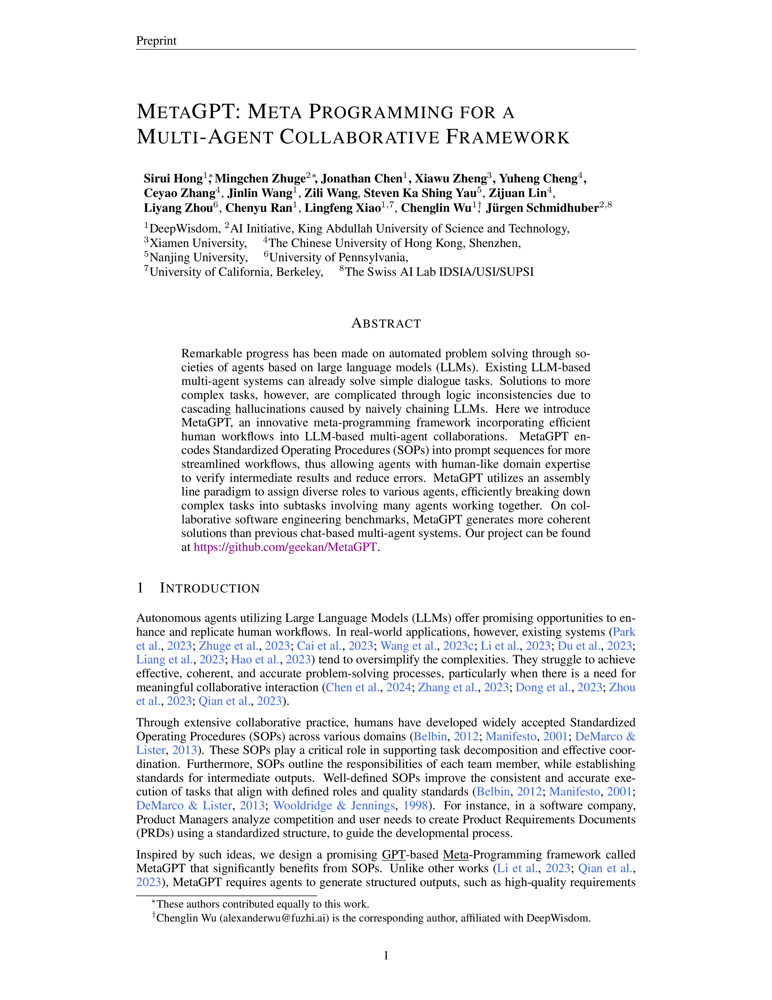

The experimental techniques used in MetaGPT focus on improving code generation quality and efficiency. One key technique is the use of an executable feedback mechanism, which allows agents to iteratively refine code based on runtime results. This approach has shown significant improvements in code quality, as evidenced by MetaGPT's performance on benchmarks like HumanEval and MBPP, where it achieved state-of-the-art results.

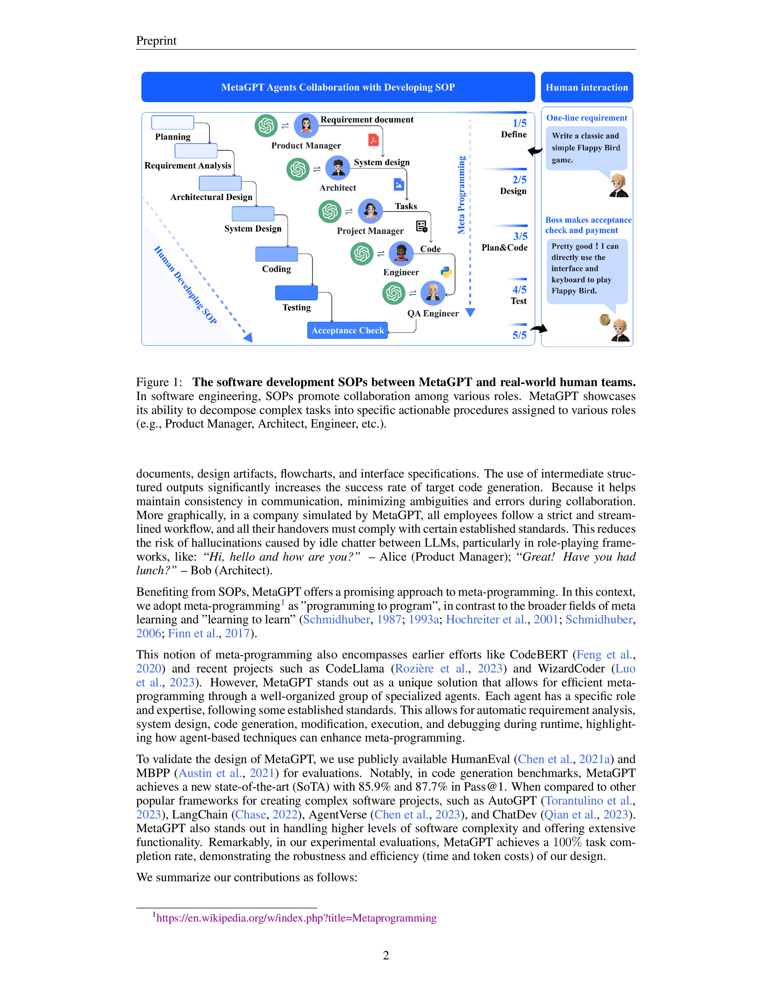

MetaGPT's structured communication protocol enhances collaboration by using a publish-subscribe mechanism. This allows agents to share and access relevant information efficiently, reducing the risk of information overload and ensuring that agents receive only task-related data. This method supports the framework's goal of minimizing errors and improving task completion rates.

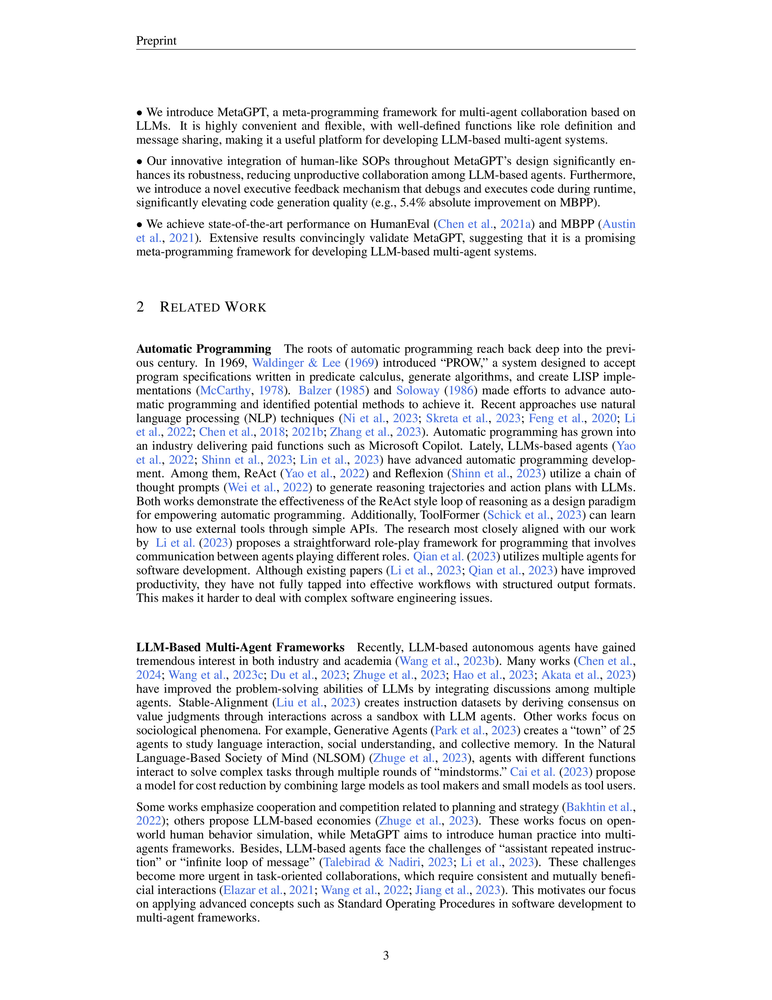

The framework's ability to decompose complex tasks into manageable subtasks is demonstrated through its application in software development projects. MetaGPT's role-based task management and SOP-driven workflows enable agents to produce high-quality outputs, such as Product Requirement Documents (PRDs), system designs, and executable code, with minimal human intervention.

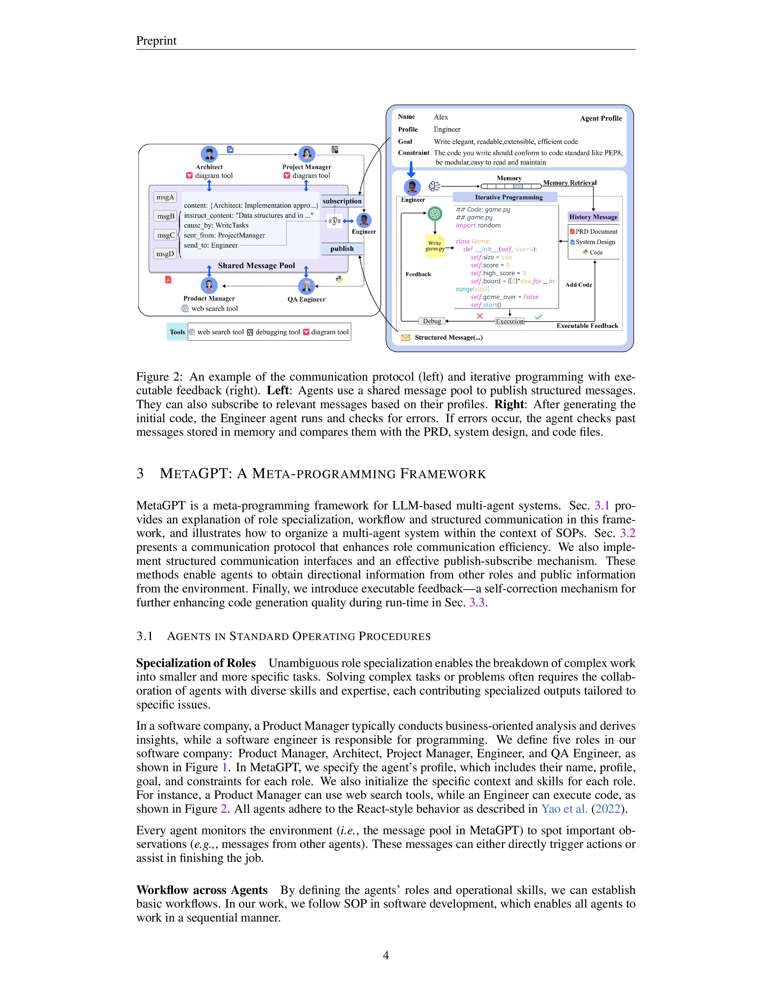

In experimental evaluations, MetaGPT outperformed other frameworks like AutoGPT and ChatDev in terms of executability and efficiency. It achieved higher scores in code quality and task completion while maintaining lower human revision costs. These results highlight the effectiveness of SOPs and structured communication in enhancing multi-agent collaboration.

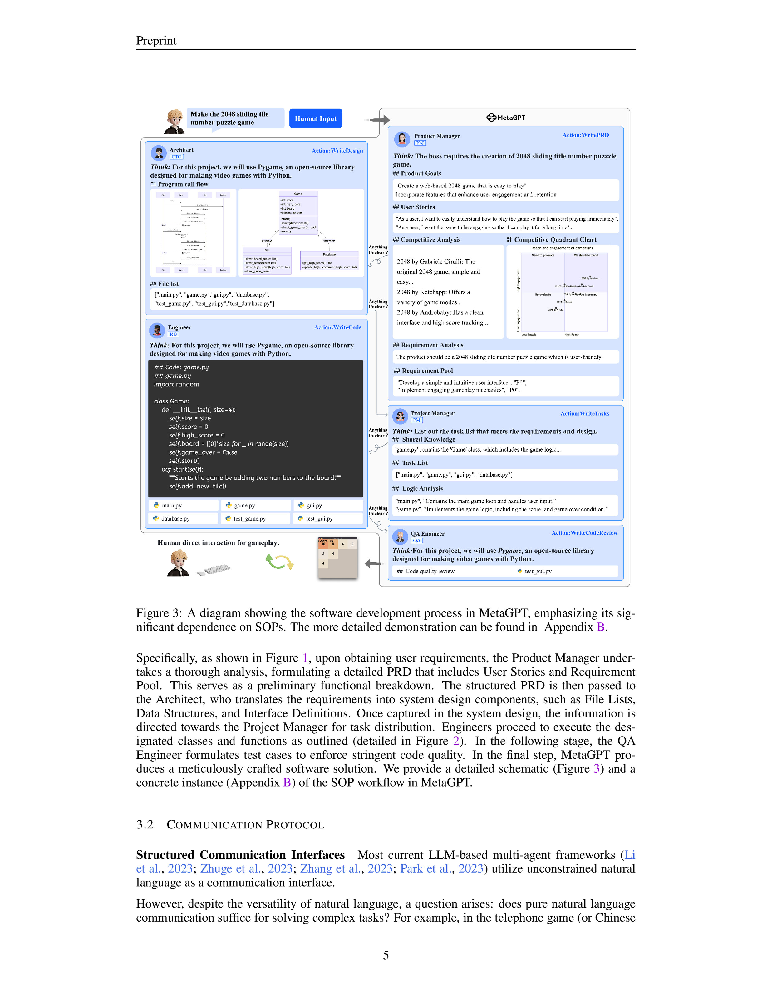

In [ ]:
ret["response"].response.render()

The MetaGPT framework introduces a novel approach to meta-programming by leveraging Standard Operating Procedures (SOPs) to enhance the problem-solving capabilities of multi-agent systems based on Large Language Models (LLMs). This framework models a group of agents as a simulated software company, utilizing role specialization, workflow management, and efficient sharing mechanisms such as message pools and subscriptions.

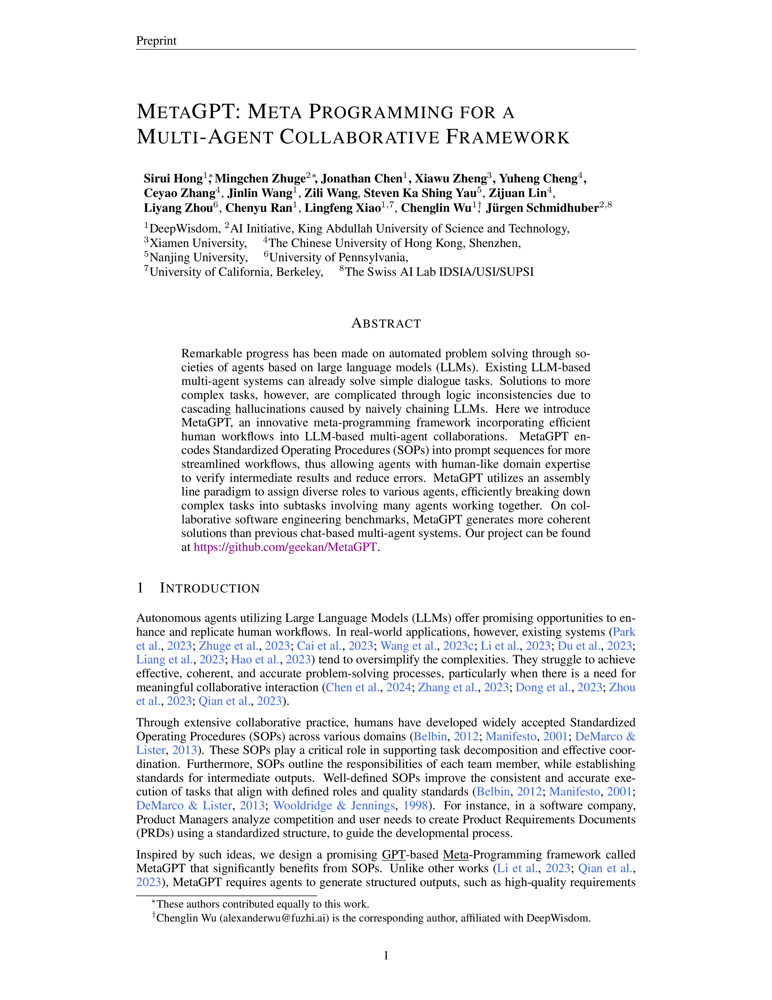

MetaGPT's experimental techniques focus on improving code generation quality and efficiency. The framework incorporates an executable feedback mechanism that allows for iterative code improvement during runtime. This mechanism significantly enhances the robustness of the generated code by enabling agents to debug and execute code, thereby reducing errors and improving performance.

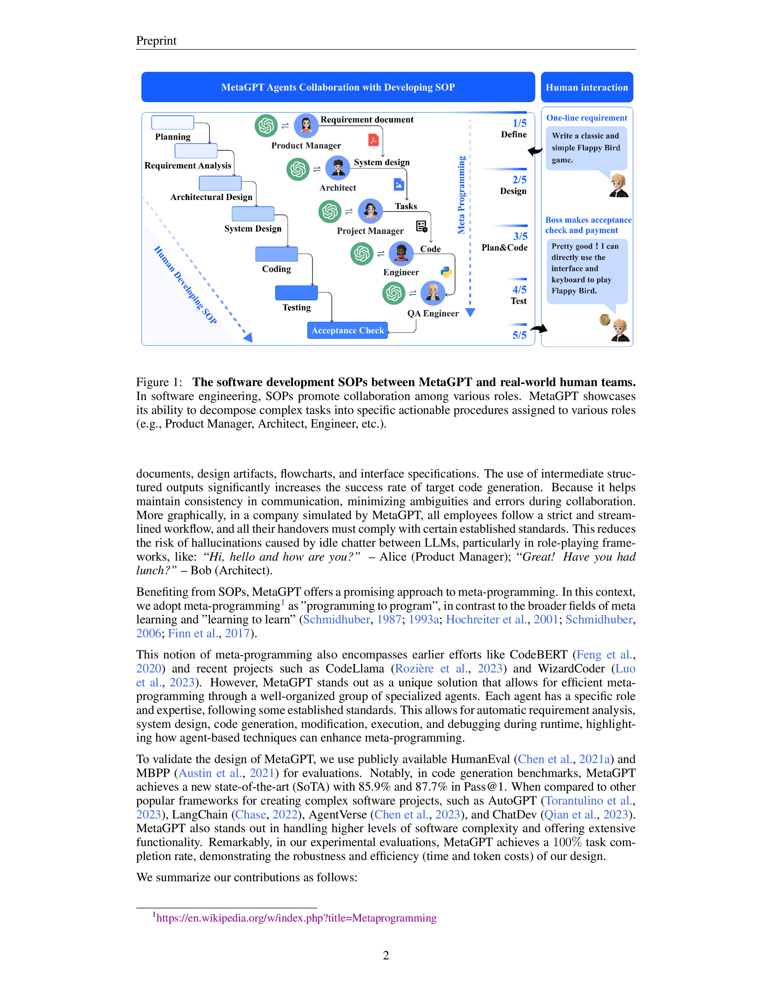

In evaluations, MetaGPT achieved state-of-the-art performance on benchmarks such as HumanEval and MBPP, with Pass@1 scores of 85.9% and 87.7%, respectively. These results demonstrate the framework's ability to handle complex software engineering tasks effectively. MetaGPT also outperformed other frameworks like AutoGPT and ChatDev in handling higher levels of software complexity and offering extensive functionality.

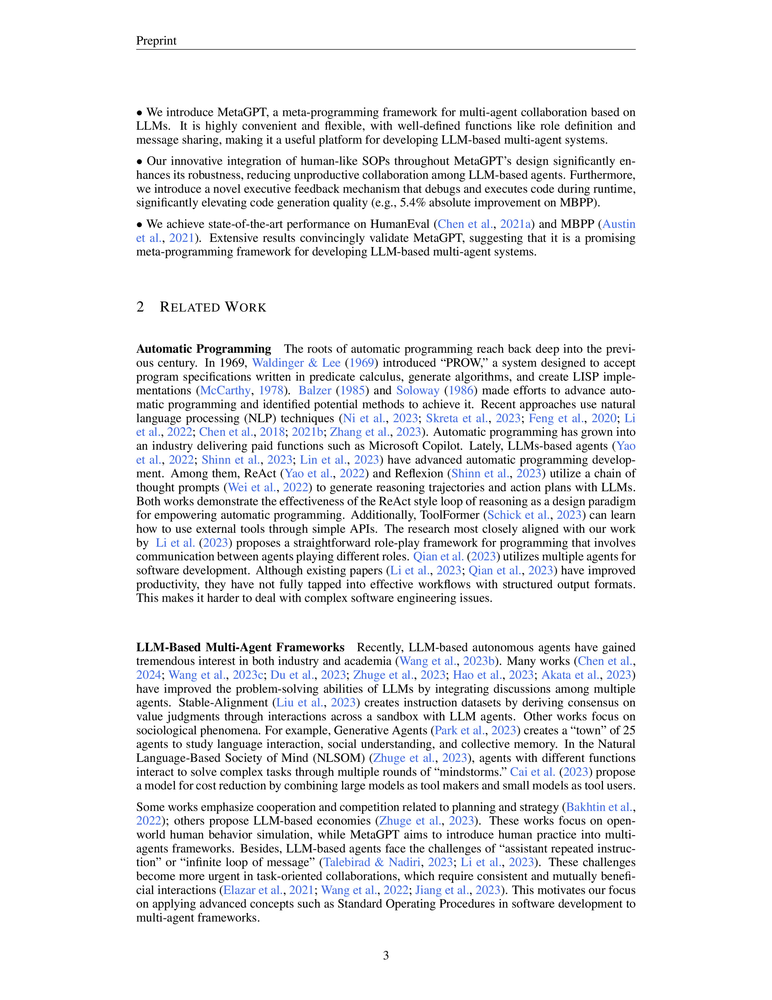

The framework's structured communication interfaces and publish-subscribe mechanism enhance collaboration among agents by ensuring that they receive only relevant information, thus avoiding information overload. This design is particularly crucial in software design scenarios where effective communication is essential.

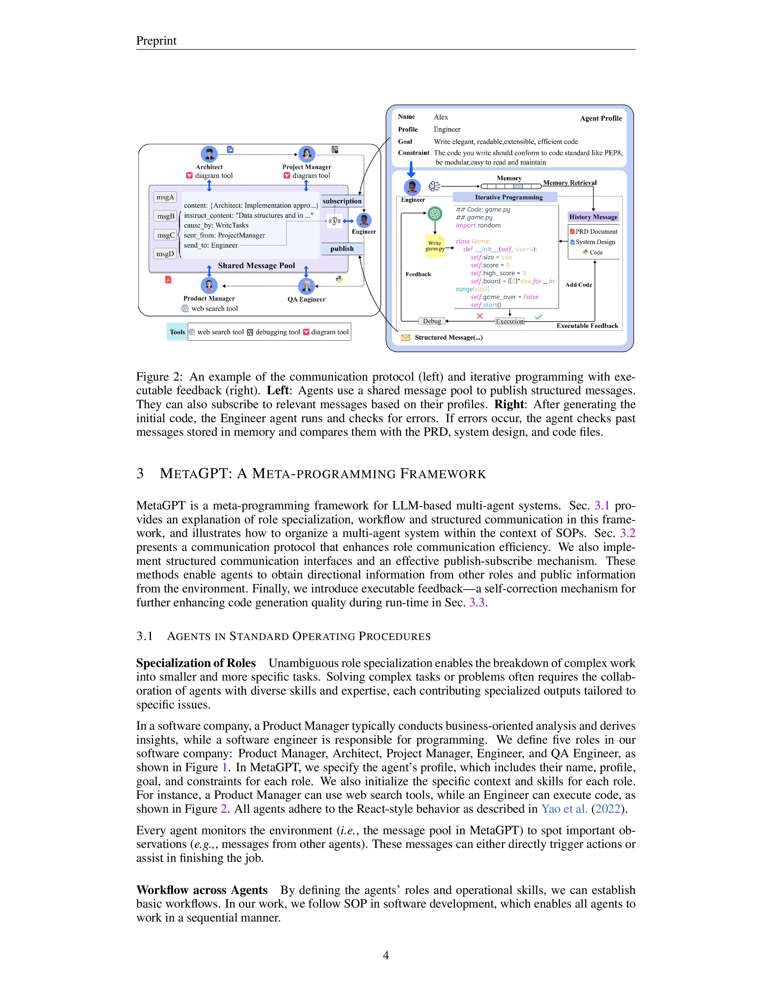

MetaGPT's experimental results highlight the benefits of SOPs in multi-agent collaborations, showcasing improved code executability and reduced human revision costs. The framework's ability to generate structured outputs, such as design artifacts and flowcharts, further supports its effectiveness in complex task decomposition and execution.

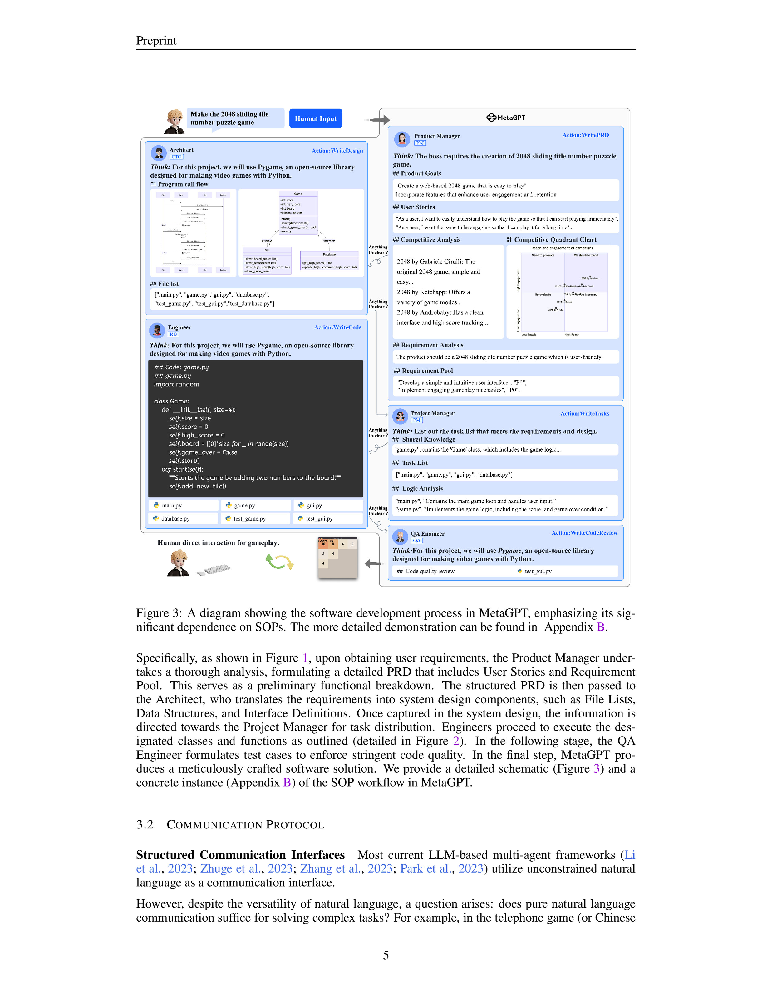

In [ ]:
ret["response"].response.render()